| ![EEW logo](https://github.com/edgi-govdata-archiving/EEW-Image-Assets/blob/main/Jupyter%20instructions/eew.jpg?raw=true) | ![EDGI logo](https://github.com/edgi-govdata-archiving/EEW-Image-Assets/blob/main/Jupyter%20instructions/edgi.png?raw=true) |
|---|---|


This notebook is licensed under GPL 3.0. Please visit our Github [repo](https://github.com/edgi-govdata-archiving/ECHO_modules) for more information.

The notebook was collaboratively authored by the Environmental Data & Governance Initiative (EDGI) following [our authorship protocol](https://docs.google.com/document/d/1CtDN5ZZ4Zv70fHiBTmWkDJ9mswEipX6eCYrwicP66Xw/)

For more information about this project, visit [our website](https://www.environmentalenforcementwatch.org/)

This is a Jupyter Notebook - a way to organize Python computer programming code. Hosting the notebook on Google Colab allows you to access and visualize data without actually needing to do any coding! The code is left visible for individuals with a knowledge of Python or for those wondering how this site was put together. This allows for a more interactive user experience.

Be sure to read the instructions in "How to Run" (below)  and the notes above each cell for important tips and context!

# ECHO_modules
*ECHO_modules* is a Python package repository for analyzing a copy of the US Environmental Protection Agency's (EPA) Enforcement and Compliance History Online (ECHO) database.

### Background
The US EPA collects a wide variety of data concerning environmental pollution and makes this available through several portals. The ECHO database collates information on industrial facilities' compliance with environmental protection laws like the Clean Water Act and regulatory agencies' enforcement of those laws. ECHO records reported violations, agency inspections of facilities, penalties paid by companies for infractions. It also incorporates information from other sources, such as reported pollutant releases from the Toxics Release Inventory and socio-economic information from EJScreen.

Unfortunately, both the web portal for ECHO (echo.epa.gov) and its API have a number of limitations. First, EPA generally only makes the past 3-5 years worth of data available through these services. Second, EPA typically does not allow aggregating information into meaningful views, such as reports of inspections by Census tract or ZIP code. Instead, searches on echo.epa.gov are usually facility-oriented. This makes it hard to understand the state of environmental enforcement and compliance across an entire geography, company, or industry sector.

In response, we make regular copies of the full set of historical records in ECHO by scraping echo.epa.gov [here](https://echo.epa.gov/files/echodownloads/). We load a number of specific tables into a [Postgresql database](https://github.com/sunggheel/edgipgdb) hosted at Stony Brook University (SBU). These tables are then linked with one another through various lookups and materialized views. For instance, the table that contains summary information about facilities (ECHO_EXPORTER) is linked to the table with detailed records on Clean Water Act violations through the `NPDES_ID` key.

`ECHO_modules` provides convenient dataset definitions and pre-defined queries that enable users to retrieve information from the SBU database and to visualize it as tables, maps, and charts. It also supports user-defined queries. With `ECHO_modules`, users can easily access summaries of EPA's records for specific geographies (e.g. a set of ZIP codes) and examine these records in relation to EPA's measures of environmental inequalities (from EJScreen).

Learn more about the SBU copy of ECHO and how it is used by ECHO_modules [here](https://github.com/edgi-govdata-archiving/ECHO_modules/blob/main/SBU-db.md). EDGI's Environmental Enforcement Watch (EEW) works with `ECHO_modules` extensively. For more on the EEW project, visit [here](https://environmentalenforcementwatch.org/) or check out project-specific repositories in the EDGI organization on GitHub.

### Interpreting ECHO Data
The ECHO database is notoriously incomplete and biased. EDGI EEW's own research, based on `ECHO_modules` and published [here](https://envirodatagov.org/wp-content/uploads/2022/09/Gaps_and_Disparities_Report.pdf), has found the following:

> * Over 19,000 facilities regulated under foundational environmental protection laws are missing basic information such as their latitude and longitude. Nearly all — 19,657 out of 19,675 (99.9%) — of these are SDWA-regulated facilities.
> * Data needed for basic EJ assessments, such as the percent minority population surrounding a facility or the Census block it resides in, is missing for 14% of the facilities in EPA’s most public-facing database. This increases to 83% of facilities regulated under SDWA.
> * Nationally, the typical facility regulated under each of these environmental protection laws is missing:
>   * 86% of CWA-specific information
>   * 86% of RCRA-specific information
>   * 71% of CAA-specific information
>   * 40% of SDWA-specific information
> * Facilities in majority-minority communities have somewhat worse data quality scores than facilities in majority-white communities, for all acts except SDWA.
> * Data missingness is substantially worse for facilities in areas already screened by EPA to be of particular concern for environmental injustices and majority-minority areas when looking at Clean Water Act inspections in particular.
> * 78% of all facilities regulated under the CWA are missing inspection counts, but only 75% of facilities in majority white areas, rising to 83% of facilities in majority-minority areas.
> * Western states including Texas, New Mexico, Colorado, Utah, and Nevada are much worse when it comes to inspection data completeness for facilities in majority-minority communities.

Simply put, ECHO records are flawed because they rely on industry and state self-reporting. For instance, the emissions levels industry provides to EPA are typically estimates rather than direct measurements. ProPublica [has found](https://www.propublica.org/article/whats-polluting-the-air-not-even-the-epa-can-say) that these estimates actually tend to be *overestimates* - industry knows EPA lacks the will and capacity to look into large emitters, while submitting lower numbers might raise suspicion.

ECHO records also reflect a flawed governance system. Determining that a facility is in violation of its permit to pollute typically requires either accurate and honest self-reporting of emissions, or regulatory inspections of the facility. However, facility inspections have been in decline since at least the Obama administration. Thus, "true" violations are unlikely to be noticed and recorded. In other words, the ECHO database is rife with type II statistical errors ("false negatives").

Even when violations are flagged, it is important to keep in mind that these represent emissions above and beyond permitted thresholds (if they are not paperwork violations), but whether or not these permitted thresholds are adequate is entirely different question. Just because a facility is *not* in violation of its permit does not mean that it is inconsequential to human and environmental health, since most permits to pollute do not account for the cumulative effects of multiple polluters in a region or the synergistic effects of multiple pollutants.

[According to](https://global.oup.com/academic/product/next-generation-compliance-9780197656747) former EPA director of enforcement and compliance assurance Cynthia Giles (2020), records related to the Clean Water Act's National Pollutant Discharge Elimination System (NPDES) tend to be the most reliable, in part because of federal requirements that all regulated facilities submit digitized records straight to US EPA.

Any interpretations you make of ECHO data accessed through `ECHO_modules` should keep all the above in mind. For instance, EEW prefers to use language such as "reported violations" and "estimated emissions" when discussing findings.

### How to Run this Notebook
![Instructions for running a Jupyter Notebook](https://github.com/edgi-govdata-archiving/EEW-Image-Assets/blob/main/overall_instructions.png?raw=true)

# Install ECHO_modules

In [ ]:
!pip install ECHO_modules &>/dev/null; # ECHO_modules

# Basic Usage
## Analyze Currently Active Facilities in a County

In the following example, we retrieve all of the currently active facilities (according to EPA) in Erie County in New York.

In [2]:
from ECHO_modules.utilities import get_active_facilities # Use the get_active_facilities function

erie = get_active_facilities("NY", "County", ["ERIE"])
erie

/usr/local/lib/python3.11/dist-packages/ECHO_modules/get_data.py:30: DtypeWarning: Columns (5,73,104,105,108,119) have mixed types. Specify dtype option on import or set low_memory=False.
  ds = pd.read_csv(data_location,encoding='iso-8859-1',


,FAC_NAME,FAC_STREET,FAC_CITY,FAC_STATE,FAC_ZIP,FAC_COUNTY,FAC_FIPS_CODE,FAC_EPA_REGION,FAC_INDIAN_CNTRY_FLG,FAC_FEDERAL_FLG,...,FAC_DATE_LAST_INSPECTION_STATE,FAC_DATE_LAST_FORMAL_ACT_EPA,FAC_DATE_LAST_FORMAL_ACT_ST,FAC_DATE_LAST_INFORMAL_ACT_EPA,FAC_DATE_LAST_INFORMAL_ACT_ST,FAC_FEDERAL_AGENCY,TRI_REPORTER,FAC_IMP_WATER_FLG,EJSCREEN_FLAG_US,wkb_geometry
REGISTRY_ID,,,,,,,,,,,,,,,,,,,,,
110071715012,UNILAND PROPERTY MANAGEMENT CORPORATION - 250 ...,250 COOPER AVE STE 106,TONAWANDA,NY,14150,ERIE,36029.0,2.0,N,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0101000020AD1000000DA7CCCD37BA53C0362383DC457E...
110046242678,NATIONAL GRID MANHOLE 330 VIRGINIA ST,VIRGINIA ST & TRINITY PLACE,BUFFALO,NY,14201,ERIE,36029.0,2.0,N,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0101000020AD1000006E5166834CB853C0C971A774B072...
110014448482,LEROY PROPERTIES,2101 KENMORE AVE BLDG 1-12,BUFFALO,NY,14207,ERIE,36029.0,2.0,N,NaN,...,05/19/2006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0101000020AD100000EC866D8B32B953C03A58FFE7307B...
110004405028,BERGUMS COLLISION INC,4685 BROADWAY,DEPEW,NY,14043,ERIE,36029.0,2.0,N,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0101000020AD1000000D8E9257E7AC53C08195438B6C73...
110040833257,CARSTAR EASTERN HILLS,6705 TRANSIT RD.,WILLIAMSVILLE,NY,14221,ERIE,36029.0,2.0,N,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0101000020AD1000008DD13AAA9AAC53C067B8019F1F7A...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110070129346,UNIFRAX I LLC- PIRSON,55 PIRSON PKWY,TONAWANDA,NY,14150.0,ERIE,36029.0,2.0,N,NaN,...,03/16/2022,NaN,NaN,NaN,NaN,NaN,Y,NaN,N,0101000020AD100000E6CC76853EB953C0E8F692C6687F...
110000326709,NIAGARA MOHAWK (HUNTLEY),3500 RIVER RD,TONAWANDA,NY,14150.0,ERIE,36029.0,2.0,N,NaN,...,10/09/2024,12/09/2008,07/18/2006,04/04/2003,10/21/2003,NaN,NaN,Y,N,0101000020AD100000B30C71AC8BBB53C0B1BFEC9E3C7C...
110000326727,TONAWANDA - 3M COMPANY,305 SAWYER AVENUE,TONAWANDA,NY,14150.0,ERIE,36029.0,2.0,N,NaN,...,08/14/2024,12/17/2002,08/22/2005,NaN,07/18/2008,NaN,Y,NaN,N,0101000020AD100000C11BD2A8C0BA53C0F1845E7F127D...


## Save this Data to CSV Format

This will export the above dataframe as a CSV. If running this notebook in Google Colab, the CSV can be found by clicking on the folder on the left-hand side of the screen and then opening the CSV sub-folder, right-clicking on the "Facilities-NY-County-Erie.csv" file and choosing Download.

In [3]:
from ECHO_modules.utilities import write_dataset
write_dataset(erie, "Facilities-NY-County-Erie.csv")

Wrote CSVs/Facilities-NY-County-Erie.csv


## Find and Chart the 10 Facilities Least Compliant with the Resource and Conservation Recovery Act (RCRA) over the Past 12 Quarters in this County

EPA provides summary data on inspections, violations, and penalties under various environmental protection laws. In the following example, we access that summary data for RCRA-regulated facilities in Erie County, sort it, and then chart it.

<Axes: title={'center': 'RCRA facilities with the most non-compliant quarters in NY - Erie County'}, xlabel='Non-compliant quarters', ylabel='Facility'>

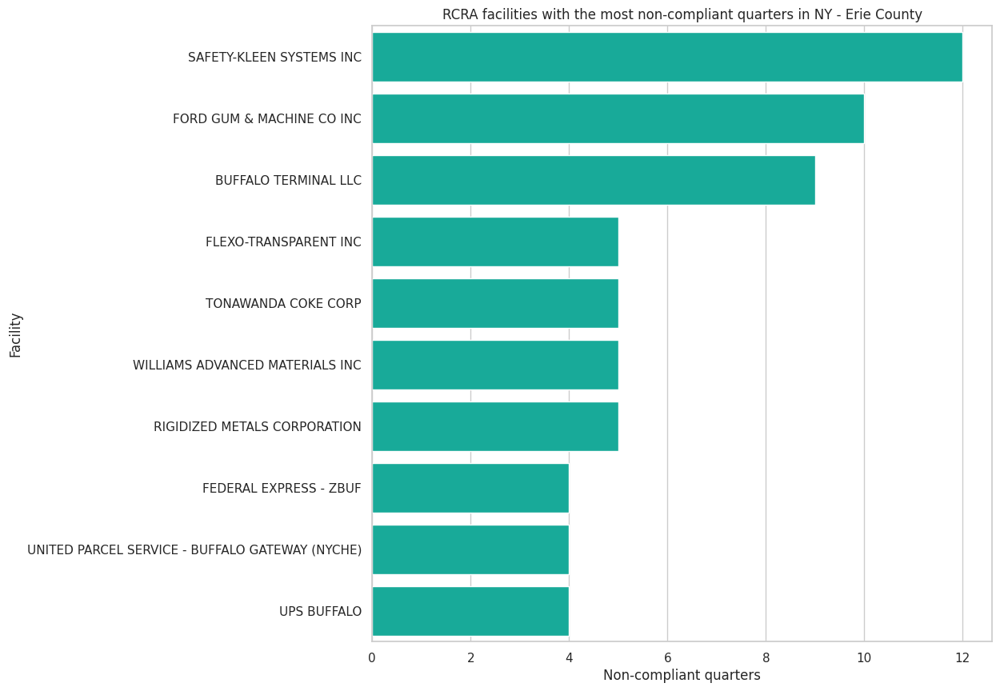

In [4]:
# Next, we enter the dataframe of Erie County facilities into the get_top_violators() function, then use chart_top_violators to visualize the result
# Use get_top_violators and chart_top_violators
from ECHO_modules.utilities import get_top_violators, chart_top_violators

erie_top_violators = get_top_violators( erie, flag = 'RCRA_FLAG',
                                       noncomp_field = 'RCRA_3YR_COMPL_QTRS_HISTORY',
                                        action_field = 'RCRA_FORMAL_ACTION_COUNT',
                                        num_fac=10 )
chart_top_violators(erie_top_violators, state = 'NY', selections = "Erie County",
                    epa_pgm = "RCRA" )

## Map these Top 10 RCRA Violators

In [5]:
import geopandas # Import a Python package for creating spatial dataframes
from ECHO_modules.get_data import get_spatial_data # Module for getting spatial data from the SBU database
from ECHO_modules.geographies import spatial_tables # Variables that support spatial queries
from ECHO_modules.utilities import bivariate_map, map_style # Use this function and variable to make our map

# Query and return spatial data
county, state = get_spatial_data( region_type = "County", states = ["NY"],
                                 spatial_tables = spatial_tables, region_filter = "Erie")
bivariate_map(regions = county,
              points = geopandas.GeoDataFrame(erie_top_violators,
                                              geometry=geopandas.points_from_xy(
                                                  erie_top_violators['FAC_LONG'],
                                                  erie_top_violators['FAC_LAT']),
                                                  crs=4269
                                              )
              ) # Use Geopandas to create a spatial version of this dataframe so that it can be mapped

## Get Historical Records of RCRA Violations in this County

EPA not only produces summary information on environmental enforcement and compliance programs, it provides access to "raw" historical records. EPA says records prior to 2001 are unreliable. In this example, we use the `years` parameter to get records for violations occuring between 2009 and 2016, inclusive (Obama-era).

In [6]:
from ECHO_modules.make_data_sets import make_data_sets # Import relevant module

ds = make_data_sets(["RCRA Violations"]) # Create a DataSet for handling the data
# Store results for this DataSet as a DataSetResults object
erie_rcra_violations = ds["RCRA Violations"].store_results(
    region_type="County", region_value=["ERIE"], state="NY", years=[2009,2016])
erie_rcra_violations.dataframe # Show the results as a dataframe

Data last modified: 2025-01-19 00:00:00
There were 313 program records found


,ACTIVITY_LOCATION,VIOLATION_TYPE,VIOLATION_TYPE_DESC,VIOL_DETERMINED_BY_AGENCY,DATE_VIOLATION_DETERMINED,ACTUAL_RTC_DATE,SCHEDULED_COMPLIANCE_DATE,FAC_DERIVED_HUC,REGISTRY_ID,FAC_NAME,...,FAC_ZIP,FAC_COUNTY,FAC_NAICS_CODES,FAC_EPA_REGION,FAC_LAT,FAC_LONG,FAC_DERIVED_WBD,FAC_DERIVED_CD113,FAC_PERCENT_MINORITY,FAC_POP_DEN
ID_NUMBER,,,,,,,,,,,,,,,,,,,,,
NYR000167551,NY,262.C,Standards Applicable to Generators of HW: Pre-...,S,2016-12-19,10/31/2017,NaN,4120104.0,110039565798,AAKRON RULE CORPORATION,...,14001,ERIE,323113 321999 32311,2,43.02548,-78.49225,4.120104e+10,27.0,4.250,211.44
NYR000167551,NY,XXS,State Statutory or Regulatory requirements tha...,S,2010-09-29,11/02/2010,NaN,4120104.0,110039565798,AAKRON RULE CORPORATION,...,14001,ERIE,323113 321999 32311,2,43.02548,-78.49225,4.120104e+10,27.0,4.250,211.44
NYR000167551,NY,262.C,Standards Applicable to Generators of HW: Pre-...,S,2010-09-29,11/02/2010,NaN,4120104.0,110039565798,AAKRON RULE CORPORATION,...,14001,ERIE,323113 321999 32311,2,43.02548,-78.49225,4.120104e+10,27.0,4.250,211.44
NYR000167551,NY,265.I,Interim Status Standards for Owners and Operat...,S,2016-12-19,10/31/2017,NaN,4120104.0,110039565798,AAKRON RULE CORPORATION,...,14001,ERIE,323113 321999 32311,2,43.02548,-78.49225,4.120104e+10,27.0,4.250,211.44
NYR000167551,NY,262.B,Standards Applicable to Generators of HW: Mani...,S,2016-12-19,10/31/2017,NaN,4120104.0,110039565798,AAKRON RULE CORPORATION,...,14001,ERIE,323113 321999 32311,2,43.02548,-78.49225,4.120104e+10,27.0,4.250,211.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NYD000632083,NY,262.A,Standards Applicable to Generators of HW: General,S,2016-05-06,06/11/2018,NaN,4120104.0,110058148437,AURUBIS BUFFALO INC.,...,14207,ERIE,331420 331529 331421 33142 331222 331525,2,42.94765,-78.89284,4.120104e+10,26.0,34.367,6768.19
NYD000632083,NY,261.A,ID and Listing of HW: General,S,2014-08-26,09/08/2014,NaN,4120104.0,110058148437,AURUBIS BUFFALO INC.,...,14207,ERIE,331420 331529 331421 33142 331222 331525,2,42.94765,-78.89284,4.120104e+10,26.0,34.367,6768.19
NYD000632083,NY,265.C,Interim Status Standards for Owners and Operat...,S,2016-05-06,06/11/2018,NaN,4120104.0,110058148437,AURUBIS BUFFALO INC.,...,14207,ERIE,331420 331529 331421 33142 331222 331525,2,42.94765,-78.89284,4.120104e+10,26.0,34.367,6768.19


## Show RCRA Violations Over Time in a Chart

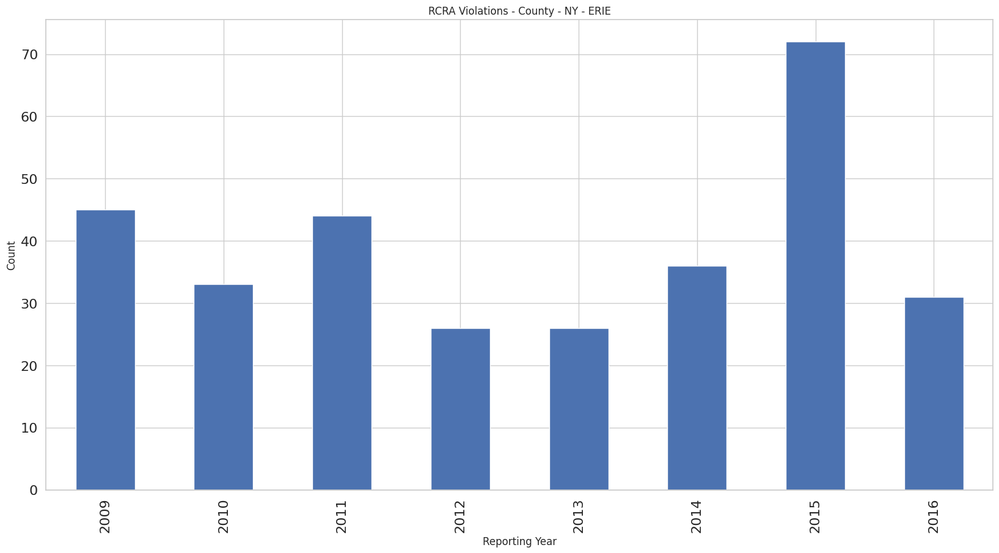

In [7]:
erie_rcra_violations.show_chart()

## Map Facilities in this County with Recorded RCRA Violations

In [8]:
from ECHO_modules.utilities import aggregate_by_facility, point_mapper # Import relevant modules

erie_rcra_violations.region_value=["ERIE"] # (re)set the region_value as a list
# Aggregate each entry using this function. In the case of RCRA violations,
# it will summarize each type of violation (permit, schedule, effluent, etc.)
# and then aggregate them for each facility over time.
# By setting other_records to True, we also get RCRA-regulated facilities in the
# county without records of violations.
aggregated_results = aggregate_by_facility(
    erie_rcra_violations, erie_rcra_violations.dataset.name, other_records=True)
# Map each facility as a point, the size of which corresponds to the number of reported violations since 2001.
point_mapper(aggregated_results["data"], aggregated_results["aggregator"],
             quartiles=True, other_fac=aggregated_results["diff"])

/usr/local/lib/python3.11/dist-packages/ECHO_modules/get_data.py:30: DtypeWarning: Columns (5,73,104,105,108,119) have mixed types. Specify dtype option on import or set low_memory=False.
  ds = pd.read_csv(data_location,encoding='iso-8859-1',


# Advanced Usage

## Select an area of interest using a map
Administrative boundaries like counties are only so meaningful when it comes to understanding environmental pollution, enforcement, and compliance trends near you. You might want to draw your own neighborhood - this utility lets you do that, and then retrieve records for facilities within those boundaries.

Run the following cell, use the tools in the left part of the map to create a shape, and then run the cell that follows to retrieve Clean Air Act violations for the area.

In [11]:
from ECHO_modules.utilities import polygon_map
area_of_interest = polygon_map()
area_of_interest

Map(center=[39.8282, -98.5796], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

set()

In [13]:
ds = make_data_sets(["CAA Violations"]) # Create a DataSet for handling the data
# Store results for this DataSet as a DataSetResults object
aoi_caa_violations = ds["CAA Violations"].store_results( region_type="Neighborhood",
                            region_value=list(area_of_interest)[0], years=[2020,2024] )
aoi_caa_violations.dataframe

Data last modified: 2025-01-19 00:00:00
224 ids were searched
13 program records were found


,ACTIVITY_ID,AGENCY_TYPE_DESC,STATE_CODE,AIR_LCON_CODE,COMP_DETERMINATION_UID,ENF_RESPONSE_POLICY_CODE,PROGRAM_CODES,PROGRAM_DESCS,POLLUTANT_CODES,POLLUTANT_DESCS,...,FAC_LONG,FAC_DERIVED_WBD,FAC_DERIVED_CD113,FAC_PERCENT_MINORITY,FAC_POP_DEN,FAC_DERIVED_HUC,FAC_SIC_CODES,FAC_NAICS_CODES,DFR_URL,Date
PGM_SYS_ID,,,,,,,,,,,,,,,,,,,,,
CO0000000800100123,3602380351,State,CO,NaN,CO000A0000080010012300010,FRV,CAASIP,State Implementation Plan for National Primary...,300000243.0,VOLATILE ORGANIC COMPOUNDS (VOCS),...,-104.955600,1.019000e+11,7.0,74.896,2228.07,10190003.0,5171,424710,http://echo.epa.gov/detailed-facility-report?f...,2020-11-26
CO0000000800101676,3602490499,State,CO,NaN,CO000A0000080010167600002,FRV,CAASIP,State Implementation Plan for National Primary...,300000243.0,VOLATILE ORGANIC COMPOUNDS (VOCS),...,-104.922139,NaN,NaN,NaN,NaN,NaN,1311,211112 211130,http://echo.epa.gov/detailed-facility-report?f...,2021-03-16
CO0000000800101574,3603374664,State,CO,NaN,CO000A0000080010157400013,FRV,CAANSPS CAASIP,New Source Performance Standards State Impleme...,300000236.0,VISIBLE EMISSIONS,...,-104.940401,1.019000e+11,7.0,64.941,2409.98,10190003.0,2951,324121,http://echo.epa.gov/detailed-facility-report?f...,2022-08-01
CO0000000800100003,3604230460,State,CO,NaN,CO000A0000080010000302056,HPV,CAAMACT CAANESH CAANSPS CAANSR CAAPSD CAASIP C...,MACT Standards (40 CFR Part 63) National Emiss...,10193 10461 300000010 300000236 300000282 3000...,Carbon monoxide FACIL Hydrogen sulfide NITROGE...,...,-104.945556,1.019000e+11,7.0,76.479,1976.29,10190003.0,2911 1629 5171 4231 4922,324110 32411 424710 48691,http://echo.epa.gov/detailed-facility-report?f...,2023-09-28
CO0000000800100003,3603611763,State,CO,NaN,CO000A0000080010000301861,HPV,CAAMACT CAANESH CAANSPS CAANSR CAAPSD CAASIP C...,MACT Standards (40 CFR Part 63) National Emiss...,10193 10461 300000010 300000236 300000243 3000...,ADMIN Carbon monoxide FACIL Hydrogen sulfide N...,...,-104.945556,1.019000e+11,7.0,76.479,1976.29,10190003.0,2911 1629 5171 4231 4922,324110 32411 424710 48691,http://echo.epa.gov/detailed-facility-report?f...,2022-11-30
CO0000000800100003,3603223291,State,CO,NaN,CO000A0000080010000301703,HPV,CAAMACT CAANESH CAANSPS CAANSR CAAPSD CAASIP C...,MACT Standards (40 CFR Part 63) National Emiss...,10193 10461 300000010 300000236 300000243,Carbon monoxide Hydrogen sulfide Sulfur dioxid...,...,-104.945556,1.019000e+11,7.0,76.479,1976.29,10190003.0,2911 1629 5171 4231 4922,324110 32411 424710 48691,http://echo.epa.gov/detailed-facility-report?f...,2021-10-19
CO0000000800100003,3602827952,State,CO,NaN,CO000A0000080010000301602,FRV,CAAMACT CAANESH CAANSPS CAANSR CAAPSD CAASIP C...,MACT Standards (40 CFR Part 63) National Emiss...,10193 10461 300000010 300000236 300000243 3000...,Carbon monoxide Hydrogen sulfide NITROGEN OXID...,...,-104.945556,1.019000e+11,7.0,76.479,1976.29,10190003.0,2911 1629 5171 4231 4922,324110 32411 424710 48691,http://echo.epa.gov/detailed-facility-report?f...,2020-11-24
CO0000000800100015,3603449802,State,CO,NaN,CO000A0000080010001500146,FRV,CAAMACT CAANSPS CAANSR CAASIP CAATVP,MACT Standards (40 CFR Part 63) New Source Per...,300000243,VOLATILE ORGANIC COMPOUNDS (VOCS),...,-104.942360,1.019000e+11,7.0,76.617,2131.47,10190003.0,5171 1629 1542,424710 42471 454310 454312,http://echo.epa.gov/detailed-facility-report?f...,2022-09-20
CO0000000800100129,3602399373,State,CO,NaN,CO000A0000080010012900027,FRV,CAASIP,State Implementation Plan for National Primary...,300000243,VOLATILE ORGANIC COMPOUNDS (VOCS),...,-104.942640,1.019000e+11,7.0,77.352,2073.08,10190003.0,2951,324121,http://echo.epa.gov/detailed-facility-report?f...,2020-10-26


## Watersheds
Many people may not know the formal name of the watershed they live in (and since watersheds are nested within each other, people live in several watersheds of various sizes, each of which likely has a different name, compounding the challenge).

Most people do, however, know which ZIP code or county they live in. To get ECHO data on a watershed basis, first we query the database for the watersheds intersecting a more well-known geography. (Note: technically, we look up watersheds *within* a more well-known geography. Unfortunately, this means some watersheds will never be selected because they are not fully contained by a state. This is an issue to be fixed.)

In the following example, we get the watersheds that intersect with a state and then look up "serious violators' of the Safe Drinking Water Act within one of those watersheds.

Note: Watershed geographies do not require setting the `state` variable to retrieve data/store results.

In [14]:
from ECHO_modules.get_data import get_spatial_data
from ECHO_modules.geographies import spatial_tables
from ECHO_modules.utilities import show_regions
from ECHO_modules.make_data_sets import make_data_sets # Import relevant module

# We look up intersecting watersheds on a state(s) basis.
watersheds, state = get_spatial_data(region_type = "Watershed", states = ["NY"],
                                     spatial_tables = spatial_tables)
# Map out the watersheds to make it clearer which one we want
show_regions(regions = watersheds, states = state, region_type = "Watershed",
             spatial_tables = spatial_tables)

watershed = watersheds.loc[watersheds["name"] == "Seneca"] # Filter to the watershed we're interested in
ds = make_data_sets(["SDWA Serious Violators"]) # Create a DataSet for handling that watershed's data
# Store results for this DataSet as a DataSetResults object.
# In some cases we have to add a "0" back on to the watershed id when it gets
# convereted to an integer.
seneca_sdwa = ds["SDWA Serious Violators"].store_results(
    region_type="Watershed", region_value=["0"+str(watershed["huc8"].iloc[0])])
seneca_sdwa.dataframe

Data last modified: 2022-01-14 00:00:00
There were 10 program records found


,PWS_NAME,CITY_SERVED,STATE,STATE_NAME,PWS_TYPE_CODE,PWS_TYPE_SHORT,SOURCE_WATER,PWS_SIZE,POPULATION_SERVED_COUNT,FISCAL_YEAR,...,FAC_LAT,FAC_LONG,FAC_DERIVED_WBD,FAC_DERIVED_CD113,FAC_PERCENT_MINORITY,FAC_POP_DEN,FAC_DERIVED_HUC,FAC_SIC_CODES,FAC_NAICS_CODES,DFR_URL
PWSID,,,,,,,,,,,,,,,,,,,,,
NY3430021,MANCHESTER CENTRAL WD,MANCHESTER (T),NY,New York,CWS,Community,SW,Small,980,2015,...,42.971290,-77.180890,41402010403,23,5.155,287.76,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY3304334,SYRACUSE CITY,SYRACUSE (C),NY,New York,CWS,Community,SW,Very Large,192000,2011,...,43.050750,-76.127605,41402011507,24,45.592,5023.48,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY4901195,OVID VILLAGE,OVID (V),NY,New York,CWS,Community,SW,Small,990,2015,...,42.678600,-76.823910,41402010807,23,37.517,155.62,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY4901195,OVID VILLAGE,OVID (V),NY,New York,CWS,Community,SW,Small,990,2016,...,42.678600,-76.823910,41402010807,23,37.517,155.62,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY4830037,DIX WATER DISTRICT #1,DIX (T),NY,New York,CWS,Community,SW,Very Small,201,2015,...,42.379800,-76.868220,41402010801,23,3.893,192.38,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY6112886,SENECA DRUMS TRAILER PARK,MILO (T),NY,New York,TNCWS,Non-Community,SW,Very Small,80,2018,...,42.834730,-77.300600,41402010204,27,4.398,285.78,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY6112886,SENECA DRUMS TRAILER PARK,MILO (T),NY,New York,TNCWS,Non-Community,SW,Very Small,80,2019,...,42.834730,-77.300600,41402010204,27,4.398,285.78,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
NY3700938,NORTHRIDGE ACRES,SCHROEPPEL (T),NY,New York,CWS,Community,GW,Very Small,50,2015,...,43.083640,-76.182420,41402011509,24,26.814,3419.37,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...
PA2580910,PRIESTHOOD RESTORATION SITE,NaN,PA,Pennsylvania,TNCWS,Non-Community,GW,Very Small,25,2018,...,43.007882,-77.226956,41402010103,23,4.619,149.87,4140201,NaN,NaN,http://echo.epa.gov/detailed-facility-report?f...


## Multiple Geographies
A DataSetResults object can only store one kind of geography (e.g. ZIP codes OR Counties) but it can store multiple values of that geography (e.g. ZIPs: 53703, 52358, 04345, etc.)

Notes: ZIP Code geographies do not require setting the `state` variable to retrieve data/store results. Also, unlike with counties, which we look retrieve data for using a list like `region_value = ["ERIE"]`, for ZIP codes and watersheds we provide values in a string like `region_value = '14201,14202,14203'`

In [15]:
from ECHO_modules.make_data_sets import make_data_sets # Import relevant module
from ECHO_modules.utilities import aggregate_by_facility, point_mapper # Import relevant modules

ds = make_data_sets(["CWA Inspections"]) # Create a DataSet for handling the data
# Store results for this DataSet as a DataSetResults object
buffalo_cwa_inspections = ds["CWA Inspections"].store_results(
    region_type="Zip Code", region_value='14201,14202,14203')
aggregated_results = aggregate_by_facility(
    records = buffalo_cwa_inspections,
    program = buffalo_cwa_inspections.dataset.name,
    other_records=True) # Aggregate each entry using this function
# Map each facility as a point, the size of which corresponds to the number of reported violations since 2001.
point_mapper(aggregated_results["data"], aggregated_results["aggregator"],
             quartiles=True, other_fac=aggregated_results["diff"])

Data last modified: 2025-01-19 00:00:00
There were 33 program records found


## Multiple Programs

We can load as many programs as we like for each set of geographies (in DataSetResults objects).

Information about available programs can be found in [here](https://github.com/edgi-govdata-archiving/ECHO_modules/blob/v0-1-0/SBU-db.md).

The following produces charts that summarize inspections, violations, and penalties under the Clean Air Act for two of New York's Congressional Districts - #25 and #26.

Data last modified: 2025-01-19 00:00:00
There were 6796 program records found
Data last modified: 2025-01-19 00:00:00
There were 85 program records found
Data last modified: 2025-01-19 00:00:00
There were 125 program records found


/usr/local/lib/python3.11/dist-packages/ECHO_modules/DataSetResults.py:86: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  d = d.resample('Y').sum()


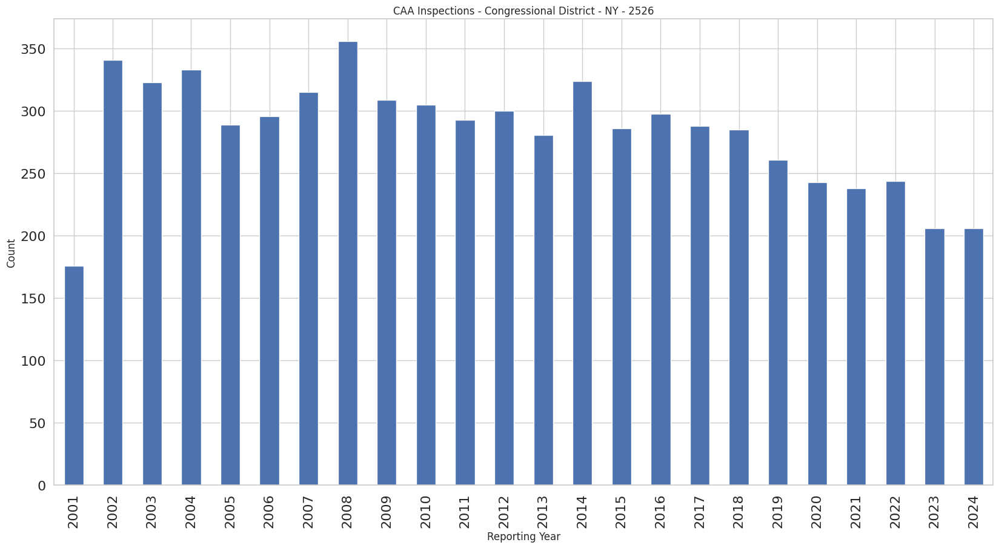

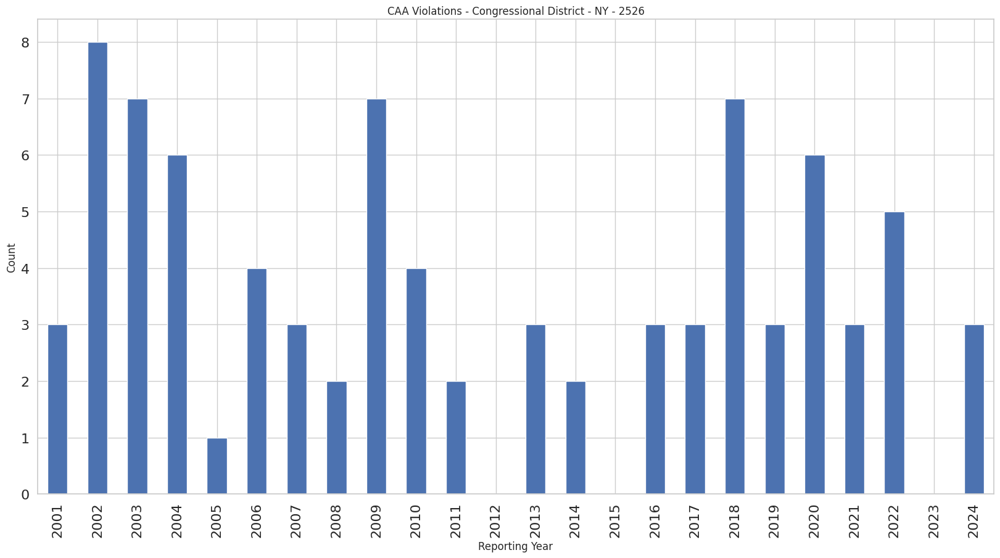

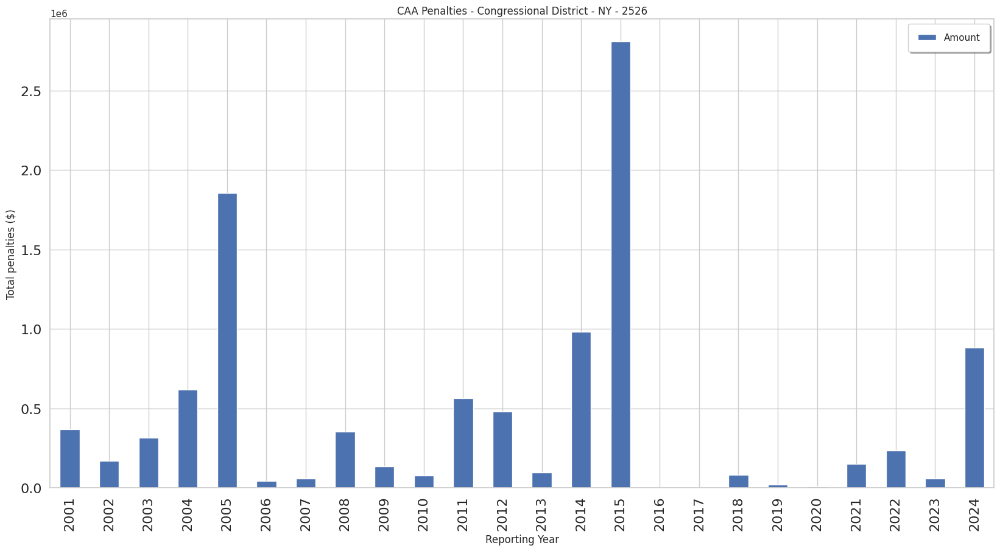

In [16]:
from ECHO_modules.make_data_sets import make_data_sets # Import relevant modules
from ECHO_modules.utilities import aggregate_by_facility, point_mapper

ds = make_data_sets(["CAA Inspections", "CAA Violations", "CAA Penalties"])
ny_cds_caa_inspections = ds["CAA Inspections"].store_results(
    region_type="Congressional District", region_value=["25", "26"], state = "NY")
ny_cds_caa_violations = ds["CAA Violations"].store_results(
    region_type="Congressional District", region_value=["25", "26"], state = "NY")
ny_cds_caa_penalties = ds["CAA Penalties"].store_results(
    region_type="Congressional District", region_value=["25", "26"], state = "NY")

ny_cds_caa_inspections.show_chart()
ny_cds_caa_violations.show_chart()
ny_cds_caa_penalties.show_chart()

## GHGs and other Air Emissions
Beyond enforcement and compliance information, the ECHO database - and our copy of it at Stony Brook University - contains records of industry's self-report releases of various pollutants. These records originate from the Greenhouse Gas Reporting Program and the Toxics Release Inventory (TRI).

The following code returns these records for New York state. If you are interested in a specific GHG or TRI pollutant, some analysis would have to be written outside existing ECHO_modules - we haven't developed specific code to filter these tables to a pollutant(s). An example of this extra code is shown below, however - `ny_tri.dataframe.loc[ny_tri.dataframe['POLLUTANT_NAME'].str.lower().str.contains("mercury")]`

Data last modified: 2025-01-19 00:00:00
There were 6664 program records found
Data last modified: 2025-01-19 00:00:00
There were 18775 program records found


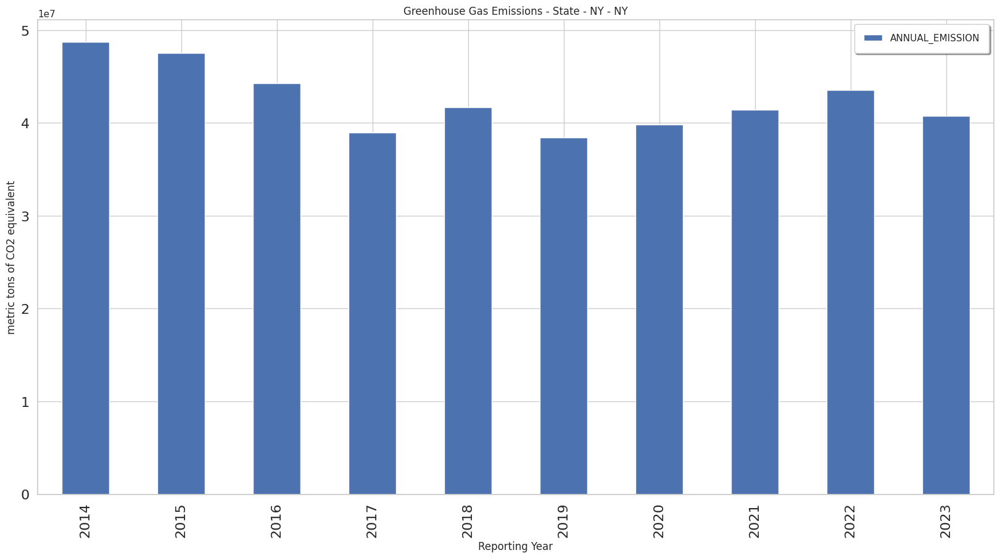

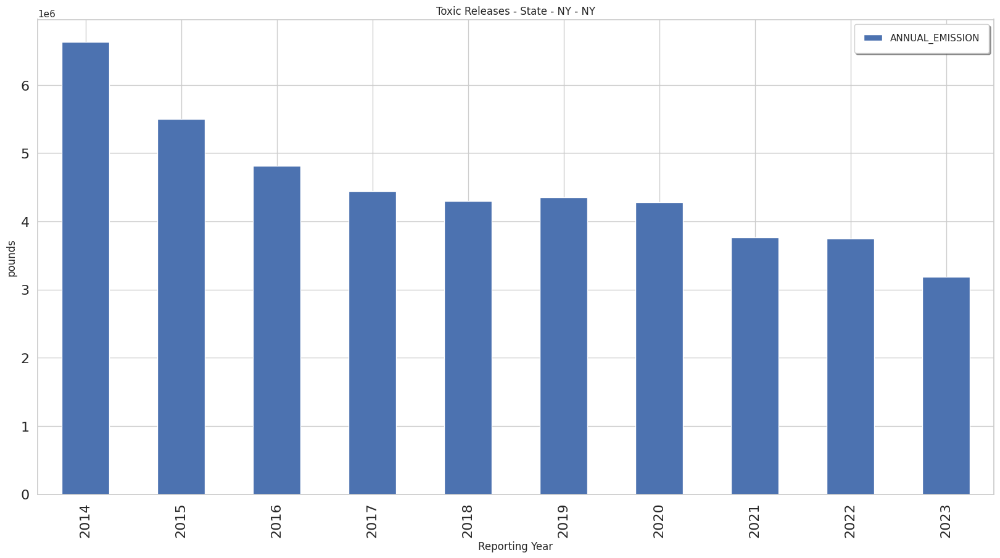

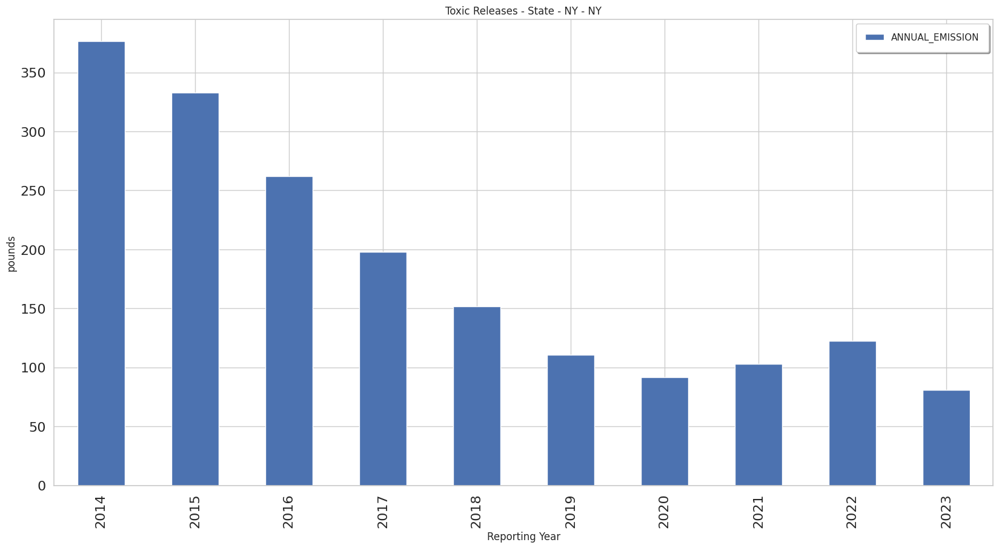

In [17]:
from ECHO_modules.make_data_sets import make_data_sets # Import relevant modules
from ECHO_modules.utilities import aggregate_by_facility, point_mapper

ds = make_data_sets(["Greenhouse Gas Emissions", "Toxic Releases"])
ny_ghg = ds["Greenhouse Gas Emissions"].store_results(
    region_type="State", region_value = "NY", state = "NY")
ny_ghg.show_chart() # Total reported emissions in lbs (normalized to CO2e)
ny_tri = ds["Toxic Releases"].store_results(
    region_type="State", region_value = "NY", state = "NY")
ny_tri.show_chart() # Total emissions in lbs

# Filter NY_TRI records to just ones where the pollutant is mercury
ny_tri.dataframe = ny_tri.dataframe.loc[
    ny_tri.dataframe['POLLUTANT_NAME'].str.lower().str.contains("mercury")]
ny_tri.show_chart() # Chart total mercury emissions in lbs

## Discharge Monitoring Reports (DMRs)

Facilities regulated under the Clean Water Act are required to submit monitoring reports directly to EPA. These represent extensive records of levels of pollutants discharged into waterbodies. We currently provide access to reports from Fiscal Year 2022.

The following code maps facilities with DMRs across two watersheds (note: watershed IDs currently have to be looked up separately. See "Watersheds" section above).

In [18]:
from ECHO_modules.make_data_sets import make_data_sets # Import relevant modules
from ECHO_modules.get_data import get_spatial_data # Module for getting spatial data from the SBU database
from ECHO_modules.geographies import spatial_tables # Variables that support spatial queries
from ECHO_modules.utilities import bivariate_map, map_style # Use this function and variable to make our map

ds = make_data_sets(["2022 Discharge Monitoring"]) # Create a DataSet for handling the data
dmrs = ds["2022 Discharge Monitoring"].store_results(region_type="Watershed",
                                                     region_value = '04120103, 04120102')
# The facilities in this watershed
dmrs.dataframe = dmrs.dataframe.drop_duplicates(subset=["FAC_NAME"])
# Query and return spatial data
watersheds, state = get_spatial_data(region_type = "Watershed", states = ["NY"],
                                     spatial_tables = spatial_tables,
                                     region_filter = ["04120103", "04120102"])
# Map each unique DMR-reporting facility in these watersheds
# We only keep the columns we need (name, geometry) and use them for pop-ups
# with the fields/aliases parameters
bivariate_map(regions = watersheds[["name", "geometry"]],
              points = geopandas.GeoDataFrame(dmrs.dataframe,
                                              geometry=geopandas.points_from_xy(
                                                  dmrs.dataframe['FAC_LONG'],
                                                  dmrs.dataframe['FAC_LAT']),
                                                  crs=4269
                                              )[["FAC_NAME", "geometry"]],
              region_fields=["name",],
              region_aliases=["Watershed Name: ",],
              points_fields=["FAC_NAME",],
              points_aliases=["Facility Name: "],
              )

Data last modified: 2025-01-19 00:00:00
There were 16146 program records found


## Mapping
We can symbolize inspections, violations, and so on for areas such as ZIP Codes and Congressional Districts using the `choropleth()` function.

In [31]:
# Function for aggregating data by spatial unit and mapping data values by that unit (e.g. ZIP code)
from ECHO_modules.utilities import aggregate_by_geography, choropleth
from ECHO_modules.make_data_sets import make_data_sets
from ECHO_modules.get_data import get_spatial_data # Function for getting zip code boundaries
from ECHO_modules.geographies import spatial_tables # Variables that support spatial queries

zips = '14201, 14202, 14203, 14204, 14205, 14206, 14207, 14208, 14209, 14210, 14211, \
14212, 14213, 14214, 14215, 14216, 14217, 14218, 14219, 14220, 14221, 14222, \
14223, 14224, 14225, 14226, 14227, 14228, 14231, 14233, 14240, 14241, 14260, \
14261, 14263, 14264, 14265, 14267, 14269, 14270, 14272, 14273, 14276, 14280'
# Create a duplicate but differently formatted list for the get_spatial_data function
zips_list = [str(z) for z in zips.split(", ")]

# Get attribute data
ds = make_data_sets(["CWA Violations"]) # Create a DataSet for handling the data
ny_zips_cwa_inspections = ds["CWA Violations"].store_results(region_type="Zip Code",
                                                             region_value=zips, state = "NY") # Store results for this DataSet as a DataSetResults object


# Aggregate attribute data
ny_zips_aggregated = aggregate_by_geography(ny_zips_cwa_inspections,
                                            agg_type="sum",
                                            spatial_tables=spatial_tables)
# Reset the index to make the zip codes available to the choropleth function
ny_zips_aggregated.reset_index(inplace=True)

# Map
choropleth(polygons = ny_zips_aggregated,
           attribute = "NUME90Q",
           key_id = "FAC_ZIP",
           legend_name = "Map")

Data last modified: 2025-01-19 00:00:00
There were 5829 program records found


## Custom Queries: EJScreen

Records from EPA's EJScreen (2021) are available through custom SQL queries.

For example, the following returns EJScreen information for the state of New York and where the % of the population defined as a racial minority is greater than 75% and the % of the population defined as low-income is greater than 50%.

For more information about EJScreen, see the [documentation](https://gaftp.epa.gov/EJScreen/2021/2021_EJSCREEEN_columns-explained.xlsx) (.xlsx file).

In [32]:
from ECHO_modules.get_data import get_echo_data

# This query selects Census Block Group records from EJScreen for the state of New York and where the % of the population defined as a racial minority is greater than 75% and the % of the population defined as low-income is greater than 50%
sql = 'SELECT * FROM "EJSCREEN_2021_USPR" WHERE "ST_ABBREV" = \'NY\' ' +\
'AND "MINORPCT" > .75 AND "LOWINCPCT" > .5'
results = get_echo_data(sql)
results

,OBJECTID,ID,ACSTOTPOP,ACSIPOVBAS,ACSEDUCBAS,ACSTOTHH,ACSTOTHU,ACSUNEMPBAS,MINORPOP,MINORPCT,...,T_PM25,T_PM25_D2,T_UST,T_UST_D2,AREALAND,AREAWATER,NPL_CNT,TSDF_CNT,Shape_Length,Shape_Area
0,127774,360010026004,846,846,414,327,375,310,698,0.825059,...,7.23 ug/m3 (15%ile),77%ile,3.3 facilities/sq km area (69%ile),82%ile,2742166.0,452838.0,0,2,11684.527625,5.905165e+06
1,127692,360010001002,1275,1269,681,473,534,607,1186,0.930196,...,7.26 ug/m3 (16%ile),83%ile,7.3 facilities/sq km area (84%ile),92%ile,356872.0,0.0,0,0,3193.041281,6.605656e+05
2,127693,360010002001,2188,2074,1078,925,1089,946,2087,0.953839,...,7.26 ug/m3 (16%ile),93%ile,3.9 facilities/sq km area (73%ile),92%ile,1449294.0,0.0,0,1,7321.882579,2.682032e+06
3,127695,360010002003,1350,1350,835,633,1002,628,1197,0.886667,...,7.26 ug/m3 (16%ile),85%ile,6.1 facilities/sq km area (81%ile),91%ile,216941.0,0.0,0,0,3746.453457,4.013581e+05
4,127700,360010003004,1785,1785,1060,611,873,865,1518,0.850420,...,7.29 ug/m3 (16%ile),89%ile,13 facilities/sq km area (92%ile),97%ile,672588.0,0.0,0,0,5231.452869,1.245085e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,142550,361190031002,1989,1957,1280,829,886,875,1977,0.993967,...,8.89 ug/m3 (58%ile),93%ile,0 facilities/sq km area (16%ile),63%ile,118605.0,0.0,0,0,2346.873785,2.078409e+05
1586,142553,361190033001,921,921,582,281,305,337,905,0.982628,...,8.85 ug/m3 (57%ile),81%ile,6.3 facilities/sq km area (82%ile),88%ile,185926.0,0.0,0,0,2636.743625,3.258491e+05
1587,142561,361190035001,866,866,573,393,441,398,793,0.915704,...,8.94 ug/m3 (59%ile),80%ile,0 facilities/sq km area (16%ile),63%ile,89610.0,0.0,0,0,1845.327713,1.570525e+05
1588,142564,361190036002,961,961,634,424,463,411,878,0.913632,...,8.9 ug/m3 (58%ile),82%ile,0 facilities/sq km area (16%ile),63%ile,89386.0,0.0,0,0,2028.600654,1.566716e+05
